# 1. show dicom file as image

In [250]:
import pydicom as dicom
import matplotlib.pyplot as plt
import numpy as np
import os

# specify your image path
image_path = os.path.join('media', 'Mapa de dosis-.dcm.dcm')
ds = dicom.dcmread(image_path)

In [251]:
for key, value in ds.__dict__.items():
    print(f"{key}: {value}")
print()
print(ds)

_parent_encoding: iso8859
_dict: {(0008, 0023): RawDataElement(tag=(0008, 0023), VR=None, length=8, value=b'20250121', value_tell=288, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0008, 0033): RawDataElement(tag=(0008, 0033), VR=None, length=14, value=b'231813.262887 ', value_tell=304, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0010, 0010): RawDataElement(tag=(0010, 0010), VR=None, length=22, value=b'PeliculasRadicromicas ', value_tell=326, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0010, 0020): RawDataElement(tag=(0010, 0020), VR=None, length=2, value=b'57', value_tell=356, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0010, 2110): RawDataElement(tag=(0010, 2110), VR=None, length=18, value=b'A la ensalada roja', value_tell=366, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0028, 0002): RawDataElement(tag=(0028, 0002), VR=None, length=2, value=b'\x01\x00', value_tell=392, is_implicit_VR=True, is_little_endian=True,

In [252]:
ds.pixel_array.shape

(803, 1003)

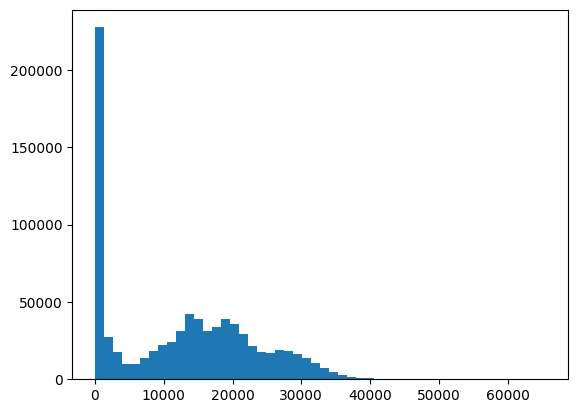

In [253]:
plt.hist(ds.pixel_array.flatten(), bins=50)
plt.show()

In [254]:
print(ds.pixel_array.min(), ds.pixel_array.max())

0 65535


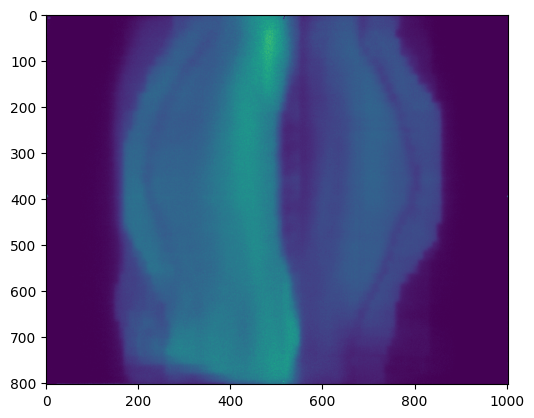

In [255]:
plt.imshow(ds.pixel_array)

In [256]:
# normalize ds
normalized_ds = (ds.pixel_array - ds.pixel_array.min()) / (ds.pixel_array.max() - ds.pixel_array.min())

In [257]:
normalized_ds.min(), normalized_ds.max()

(np.float64(0.0), np.float64(1.0))

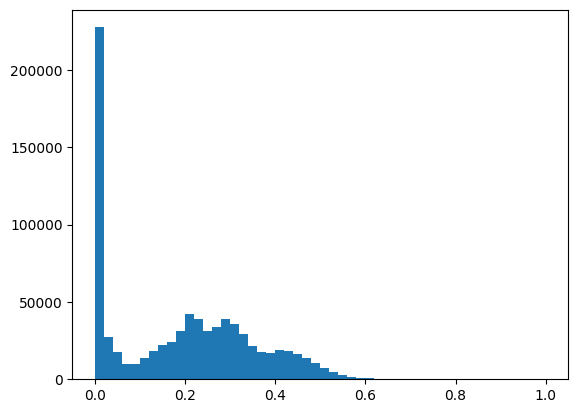

In [258]:
# histogram of the normalized ds
plt.hist(normalized_ds.flatten(), bins=50)
plt.show()

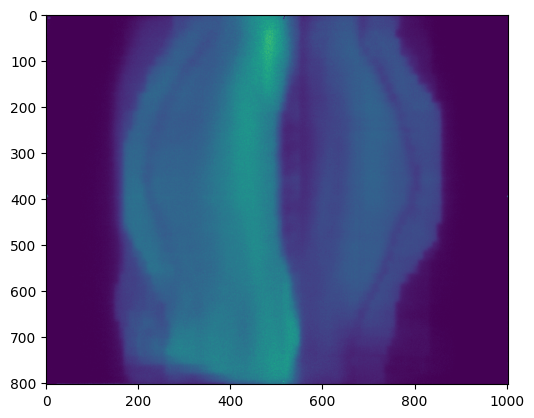

In [259]:
plt.imshow(ds.pixel_array)

# 2. Check Juliana's files

RD.1.2.246.352.71.7.593947511628.1456448.20220726133208.dcm
(256, 256)
25417663518


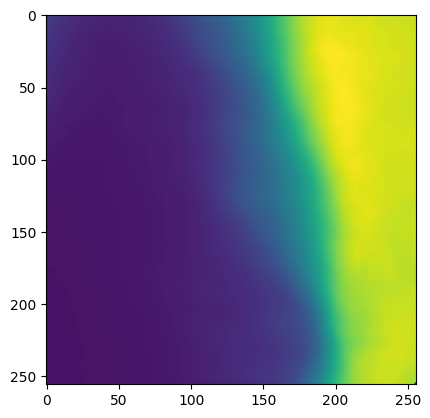

RD.1.2.246.352.71.7.593947511628.1456468.20220726133312.dcm
(256, 256)
28306546530


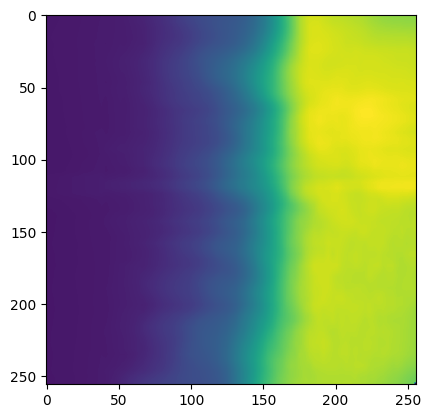

RD.1.2.246.352.71.7.593947511628.1456478.20220726133410.dcm
(256, 256)
53609105271


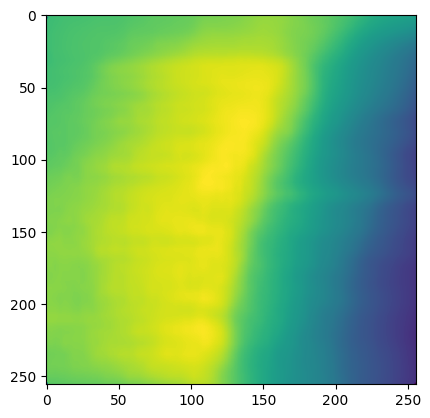

RD.1.2.246.352.71.7.593947511628.1456488.20220726133500.dcm
(256, 256)
23229949538


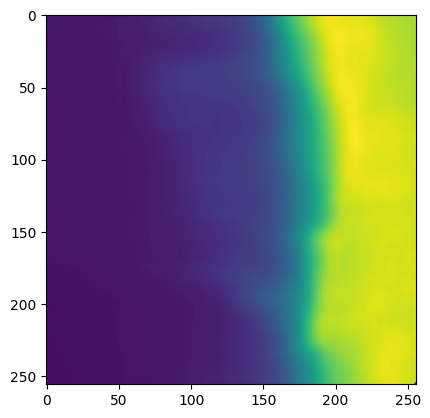

In [260]:
import pydicom as dicom
import matplotlib.pyplot as plt
import os

# specify your image path
folder_path = os.path.join('media', 'Juliana')

# go through all the dicom files in the folder
for filenameDCM in os.listdir(folder_path):

    print(filenameDCM)

    ds = dicom.dcmread(os.path.join(folder_path, filenameDCM))

    # search the positions in the matrix where the pixel value es 2147483647     
    #print(ds.pixel_array == 2147483647)
    # send those values to 0
    ds.pixel_array[ds.pixel_array == 2147483647] = 0
    print(ds.pixel_array.shape)
    print(np.sum(ds.pixel_array))
    plt.imshow(ds.pixel_array)
    plt.show()


RD.1.2.246.352.71.7.593947511628.1456448.20220726133208.dcm
(256, 256)
25419990570


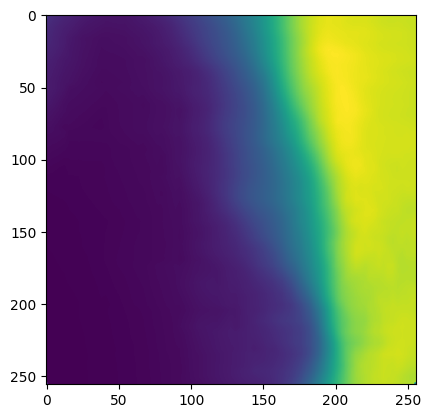

RD.1.2.246.352.71.7.593947511628.1456468.20220726133312.dcm
(256, 256)
28309138068


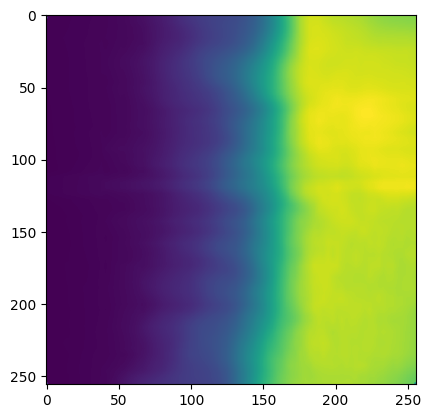

RD.1.2.246.352.71.7.593947511628.1456478.20220726133410.dcm
(256, 256)
53614013331


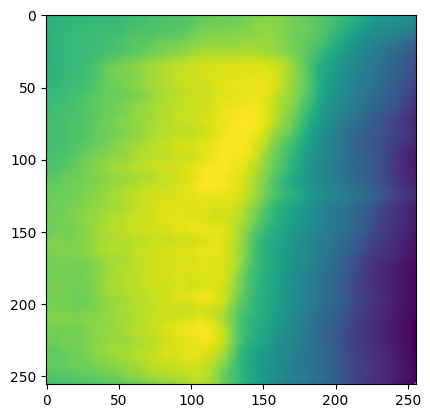

RD.1.2.246.352.71.7.593947511628.1456488.20220726133500.dcm
(256, 256)
23232076298


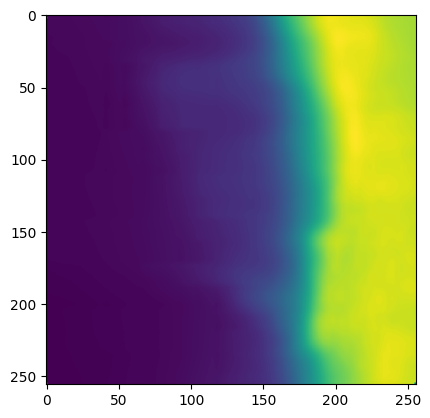

In [ ]:
import pydicom as dicom
import matplotlib.pyplot as plt
import os

# specify your image path
folder_path = os.path.join('media', 'Juliana')

# go through all the dicom files in the folder
for filenameDCM in os.listdir(folder_path):

    print(filenameDCM)

    ds = dicom.dcmread(os.path.join(folder_path, filenameDCM))

    ds_clean = ds.copy()
    ds_clean.pixel_array[ds.pixel_array == 2147483647] = 0

    promedio = ds_clean.pixel_array.mean()
    # search the positions in the matrix where the pixel value es 2147483647     
    #print(ds.pixel_array == 2147483647)
    # send those values to 0
    ds.pixel_array[ds.pixel_array == 2147483647] = promedio

    print(ds.pixel_array.shape)
    print(np.sum(ds.pixel_array))

    plt.imshow(ds.pixel_array)
    plt.show()

# 3. Check Contreras' files

Mapa de dosis-loloolloolol.dcm
(800, 1003)


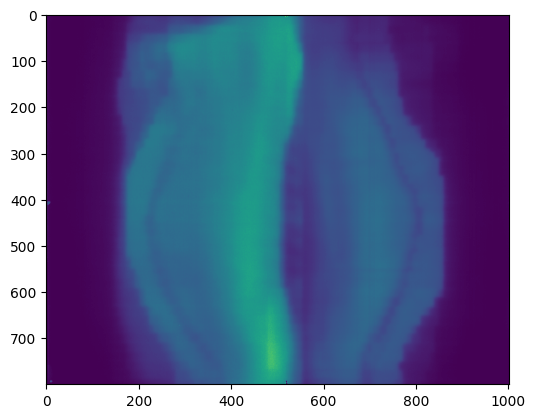

Mapa de dosis-mama-prueba1.dcm
(800, 1003)


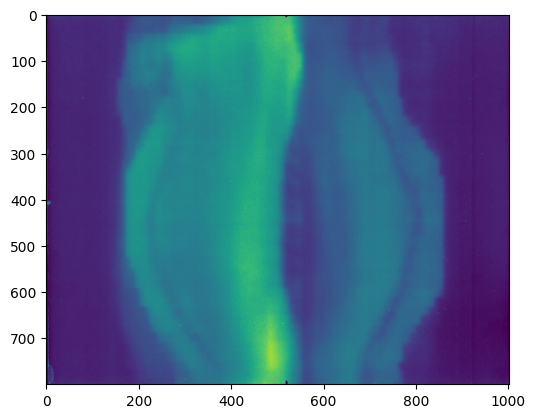

Mapa de dosis-mama2.dcm
(803, 1003)


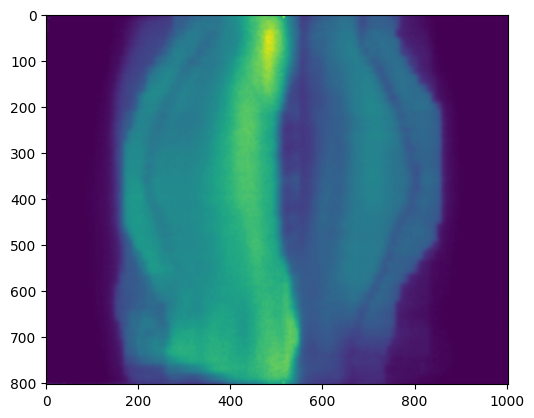

MapaDosisCCC.dcm
(800, 1003)


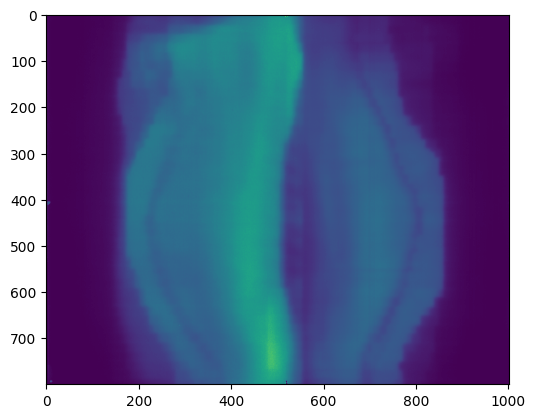

MapaMama.dcm
(800, 1003)


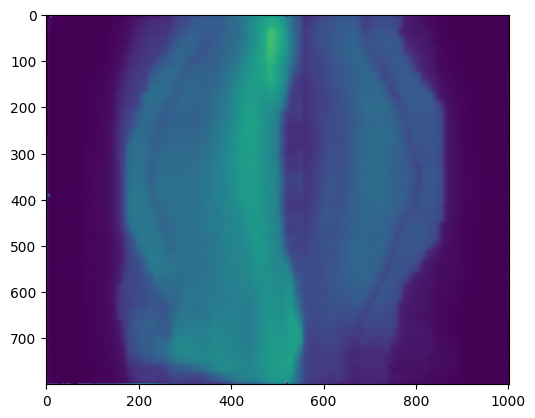

MapaMamaCentro.dcm
(800, 1003)


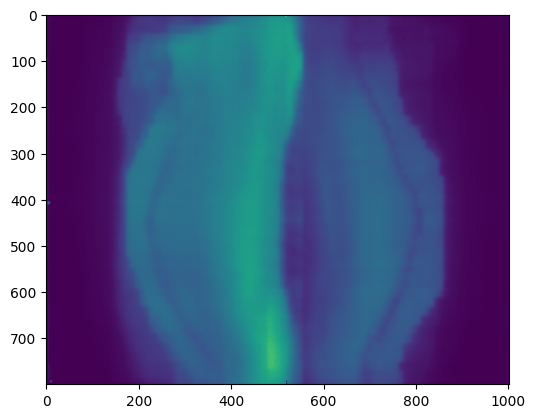

MapaMamaVolteado.dcm
(800, 1003)


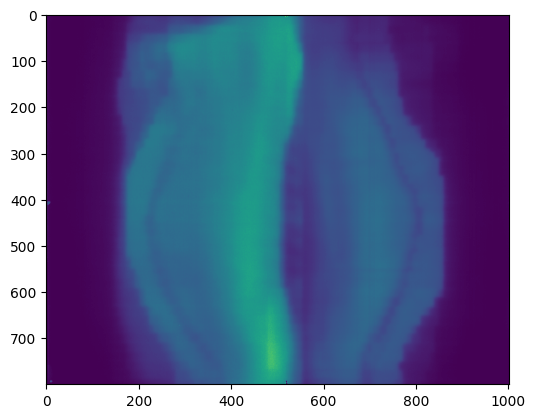

MapaMapaonCentro.dcm
(800, 1003)


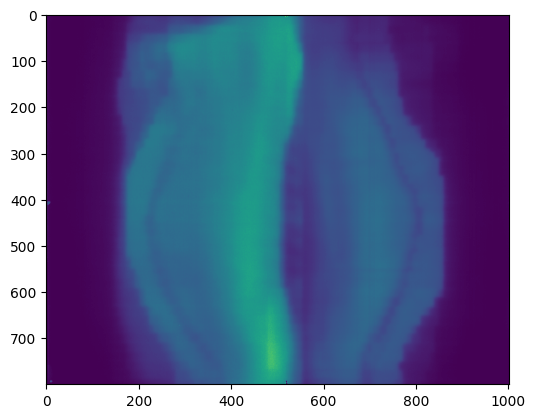

piramide.dcm
(512, 512)


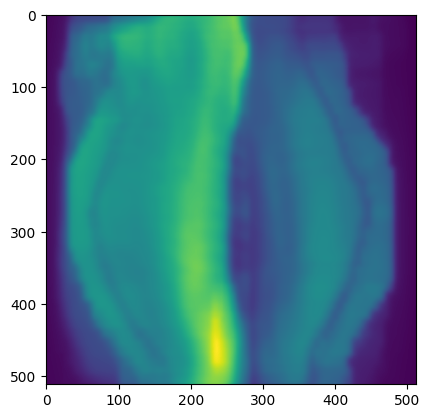

In [262]:
import pydicom as dicom
import matplotlib.pyplot as plt
import os

# specify your image path
base_folder_path = os.path.join('media', 'Contreras clasificado')
folder_path = os.path.join(base_folder_path, 'mama')

# go through all the dicom files in the folder
for filenameDCM in os.listdir(folder_path):
    print(filenameDCM)
    ds = dicom.dcmread(os.path.join(folder_path, filenameDCM))
    print(ds.pixel_array.shape)
    plt.imshow(ds.pixel_array)
    plt.show()